In [1]:
!pip install "opencv-python-headless<4.3"
!pip install cellpose

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 MB 10.9 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.10.0.82
    Uninstalling opencv-python-headless-4.10.0.82:
      Successfully uninstalled opencv-python-headless-4.10.0.82
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 1.3.1 requires opencv-python-headless>=4.1.1, but you have opencv-python-headless 3.4.18.65 which is incompatible.
qudida 0.0.4 requires opencv-python-headless>=4.0.1, but you have opencv-python-headless 3.4.18.65 which is incompatible.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 205.0/205.0 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 79.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 39.5/39.5 MB 17.3 MB/s eta 0:00:00
  Using cached nvidia_

In [2]:
!nvcc --version
!nvidia-smi

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
Wed Jun  5 17:05:08 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P8              11W /  7

import libraries and check GPU (the first time you import cellpose the models will download).

In [3]:
import numpy as np
import time, os, sys
from urllib.parse import urlparse
import skimage.io
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
mpl.rcParams['figure.dpi'] = 300

from urllib.parse import urlparse
from cellpose import models, core

use_GPU = core.use_gpu()
print('>>> GPU activated? %d'%use_GPU)


>>> GPU activated? 1


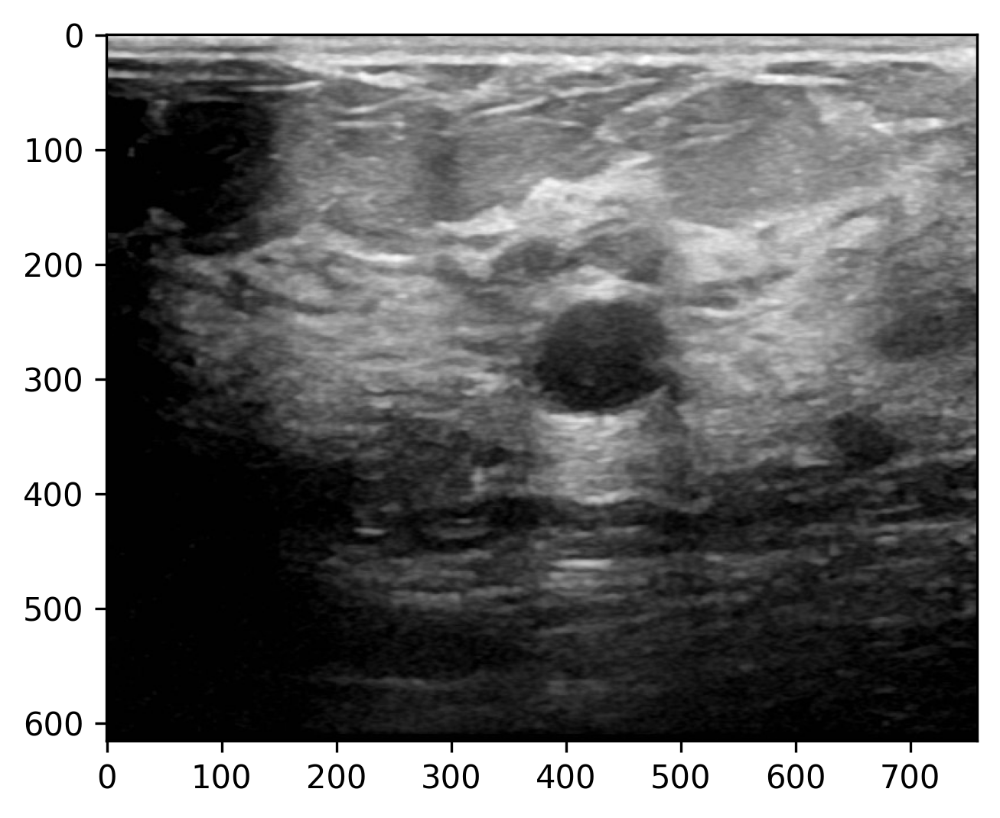

In [10]:
file_name = os.path.join('test.png')
my_img = skimage.io.imread(file_name)

plt.figure(figsize=(8,4))
plt.imshow(my_img)

In [11]:
# RUN CELLPOSE

imgs_2D = my_img

from cellpose import models

# DEFINE CELLPOSE MODEL
# model_type='cyto3' or model_type='nuclei'
model = models.Cellpose(gpu=use_GPU, model_type='cyto3')
# model = models.Cellpose(gpu=use_GPU, model_type='nuclei')
channels = [[2,3]]

masks, flows, styles, diams = model.eval(imgs_2D, diameter=15, flow_threshold=None, channels=channels)

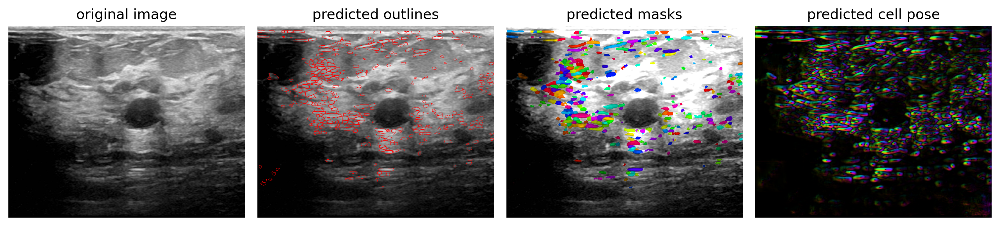

In [10]:
# DISPLAY RESULTS
from cellpose import plot

nimg = len(imgs_2D)
maski = masks
flowi = flows[0]

fig = plt.figure(figsize=(12,5))
plot.show_segmentation(fig, my_img, maski, flowi, channels=channels)
plt.tight_layout()
plt.show()

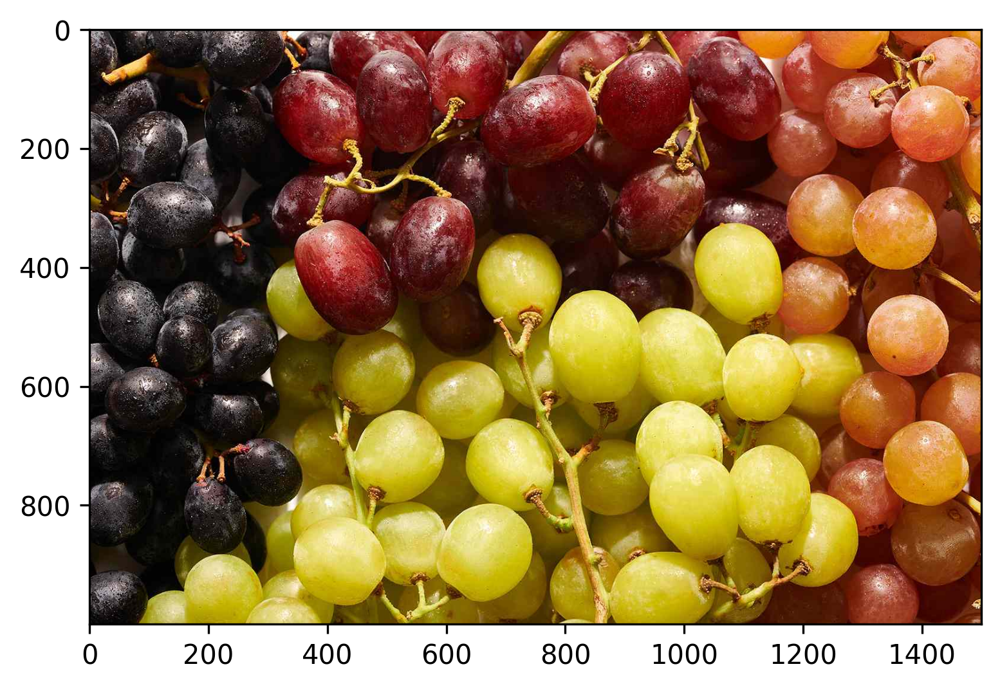

In [7]:
file_name = os.path.join('grapes.jpeg')
my_img = skimage.io.imread(file_name)

plt.figure(figsize=(8,4))
plt.imshow(my_img)

In [8]:
# RUN CELLPOSE

imgs_2D = my_img

from cellpose import models

# DEFINE CELLPOSE MODEL
# model_type='cyto3' or model_type='nuclei'
model = models.Cellpose(gpu=use_GPU, model_type='cyto3')
# model = models.Cellpose(gpu=use_GPU, model_type='nuclei')
channels = [[2,3]]

masks, flows, styles, diams = model.eval(imgs_2D, diameter=25, flow_threshold=None, channels=channels)

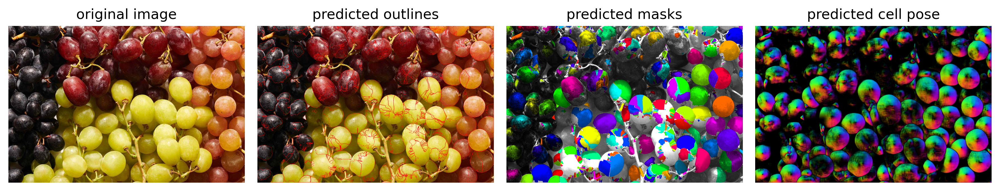

In [9]:
# DISPLAY RESULTS
from cellpose import plot

nimg = len(imgs_2D)
maski = masks
flowi = flows[0]

fig = plt.figure(figsize=(12,5))
plot.show_segmentation(fig, my_img, maski, flowi, channels=channels)
plt.tight_layout()
plt.show()

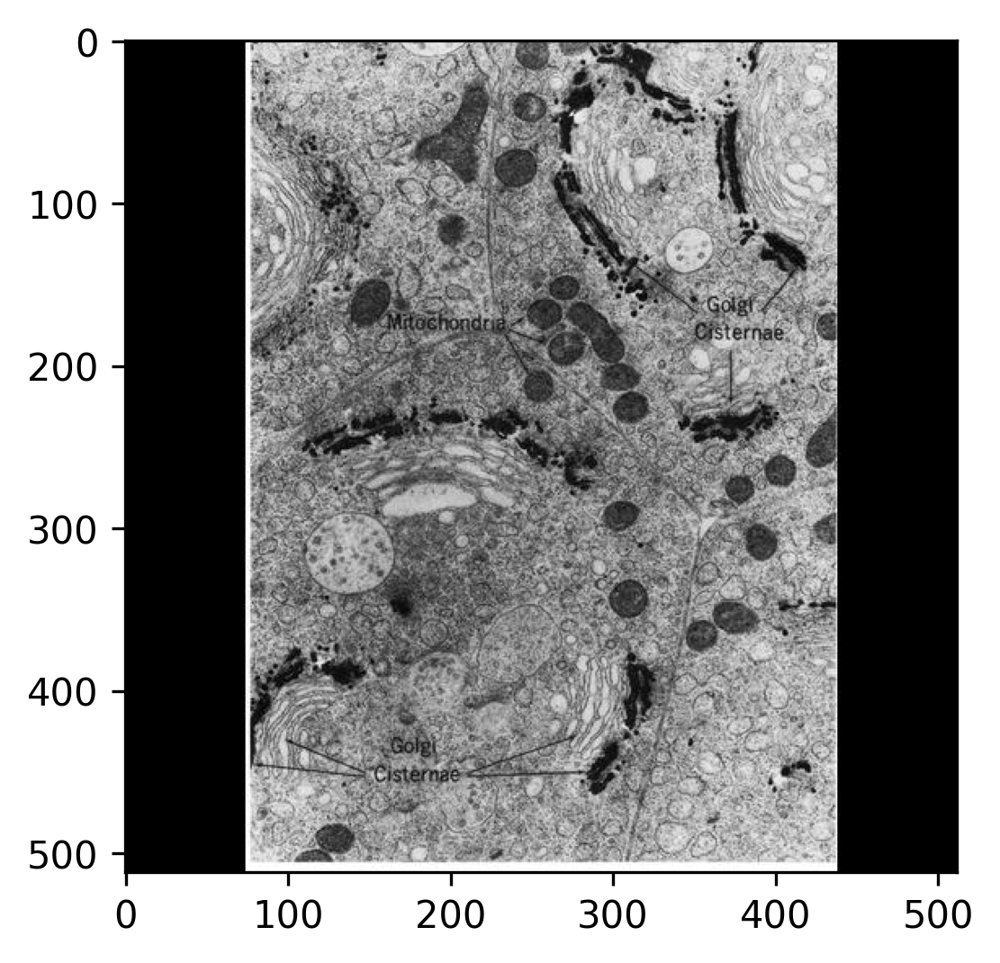

In [4]:
file_name = os.path.join('cell_lib.jpg')
my_img = skimage.io.imread(file_name)

plt.figure(figsize=(8,4))
plt.imshow(my_img)

In [5]:
# RUN CELLPOSE

imgs_2D = my_img

from cellpose import models

# DEFINE CELLPOSE MODEL
# model_type='cyto3' or model_type='nuclei'
model = models.Cellpose(gpu=use_GPU, model_type='cyto3')
# model = models.Cellpose(gpu=use_GPU, model_type='nuclei')
channels = [[2,3]]

masks, flows, styles, diams = model.eval(imgs_2D, diameter=25, flow_threshold=None, channels=channels)

100%|██████████| 25.3M/25.3M [00:03<00:00, 8.75MB/s]
100%|██████████| 3.54k/3.54k [00:00<00:00, 2.25MB/s]


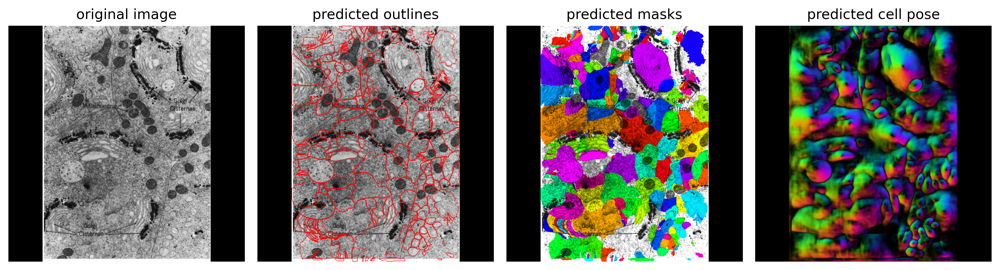

In [6]:
# DISPLAY RESULTS
from cellpose import plot

nimg = len(imgs_2D)
maski = masks
flowi = flows[0]

fig = plt.figure(figsize=(12,5))
plot.show_segmentation(fig, my_img, maski, flowi, channels=channels)
plt.tight_layout()
plt.show()